#  Violence Detection — ResNet18 + BiGRU


##  Table des Matières
1. [Setup & Imports](#1)
2. [Dataset Unification](#2)
3. [Data Cleaning & Deduplication](#3)
4. [Exploratory Data Analysis (EDA)](#4)
5. [Video Processing & Conversion](#5)
6. [Balance 50/50 & Train/Val/Test Split](#6)
7. [Dataset & DataLoaders](#7)
8. [Modèle — ResNet18 Pretrained + BiGRU](#8)
9. [Training or Load Checkpoint](#9)
10. [Détection d'Overfitting](#10)
11. [Évaluation & Métriques](#11)
12. [Explainable AI — Grad-CAM](#12)
13. [Sauvegarde du Modèle](#13)


<a id='1'></a>
## 1. ⚙️ Setup & Imports

In [1]:
# ── Install dependencies ───────────────────────────────────────────────────
!pip install grad-cam scikit-learn matplotlib seaborn tqdm --quiet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 60.3 MB/s eta 0:00:0000:0100:01
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


In [2]:
import os
import cv2
import shutil
import hashlib
import logging
import json
import time
import warnings
import random
from pathlib import Path
from collections import defaultdict
from tqdm.notebook import tqdm

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from torchvision import models, transforms

from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    classification_report, confusion_matrix,
    roc_auc_score, roc_curve, precision_recall_curve,
    average_precision_score
)

from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget

warnings.filterwarnings('ignore')

# ── Logging ───────────────────────────────────────────────────────────────
logging.basicConfig(
    level=logging.INFO,
    format='%(asctime)s | %(levelname)s | %(message)s',
    handlers=[
        logging.FileHandler('pipeline.log'),
        logging.StreamHandler()
    ]
)
log = logging.getLogger(__name__)

# ── Matplotlib style ──────────────────────────────────────────────────────
plt.rcParams.update({
    'figure.dpi': 130,
    'font.family': 'DejaVu Sans',
    'axes.spines.top': False,
    'axes.spines.right': False
})

print(f"✅ All imports OK")
print(f"🐍 PyTorch  : {torch.__version__}")
print(f"💻 CUDA     : {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"🎮 GPU      : {torch.cuda.get_device_name(0)}")

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
SEED   = 42
torch.manual_seed(SEED)
np.random.seed(SEED)
random.seed(SEED)

✅ All imports OK
🐍 PyTorch  : 2.10.0+cu128
💻 CUDA     : True
🎮 GPU      : Tesla T4


<a id='2'></a>
## 2.  Dataset Unification

In [3]:
# ════════════════════════════════════════════════════════════════════════
#  CONFIGURATION
# ════════════════════════════════════════════════════════════════════════
import datetime

TIMESTAMP = datetime.datetime.now().strftime('%Y%m%d_%H%M%S')

CFG = {
    # ── Paths ────────────────────────────────────────────────────────────
    'dataset_roots': [
        '/kaggle/input/datasets/mohamedmustafa/real-life-violence-situations-dataset',
        '/kaggle/input/datasets/magicearth25/video-violence-detection-dataset',
        '/kaggle/input/datasets/marzoukhedi/violence-by-hedi',
        '/kaggle/input/datasets/toluwaniaremu/smartcity-cctv-violence-detection-dataset-scvd',
    ],
    'unified_dir'   : '/kaggle/working/unified_dataset',
    'converted_dir' : '/kaggle/working/converted_dataset',

    # ── Label mapping ─────────────────────────────────────────────────────
    'fight_keywords'   : {'violence', 'fight', 'weaponized'},
    'nofight_keywords' : {'nonviolence', 'nonfight', 'normal', 'nofight'},
    'video_exts'       : {'.mp4', '.avi', '.mov', '.mkv', '.wmv', '.flv', '.webm'},

    # ── ResNet18 + BiGRU ──────────────────────────────────────────────────
    'num_frames'    : 16,
    'img_size'      : 224,
    'hidden_size'   : 512,
    'gru_layers'    : 2,
    'dropout'       : 0.3,
    'fc_dropout'    : 0.5,

    # ── Training ──────────────────────────────────────────────────────────
    'epochs'        : 24,
    'batch_size'    : 16,
    'lr'            : 1e-4,
    'weight_decay'  : 1e-4,
    'label_smooth'  : 0.1,
    'patience'      : 8,
    'num_workers'   : 4,
    'grad_clip'     : 1.0,
    'warmup_epochs' : 3,

    # ── Split & Balance ───────────────────────────────────────────────────
    'train_ratio'    : 0.8,
    'val_ratio'      : 0.1,
    'test_ratio'     : 0.1,
    'balance_50_50'  : True,

    # ── Overfitting detection ─────────────────────────────────────────────
    'overfitting_gap': 0.07,

    # ── Output ────────────────────────────────────────────────────────────
    'classes'        : ['noFight', 'fight'],

    # ── Checkpoint paths ──────────────────────────────────────────────────
    'best_model_path'  : 'model_resnet18_bigru_best.pth',
    'last_ckpt_path'   : 'model_resnet18_bigru_last.pth',
    'history_path'     : 'training_history.json',
    'splits_path'      : 'dataset_splits.json',
    'label_map_path'   : 'label_map.json',

    # ── Legacy alias (used in some eval cells) ────────────────────────────
    'model_path'       : 'model_resnet18_bigru_best.pth',
}

SEED = 42
torch.manual_seed(SEED); np.random.seed(SEED); random.seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)
    torch.backends.cudnn.benchmark     = True
    torch.backends.cudnn.deterministic = False

print('✅ Configuration loaded')
print(f'   Frames / clip   : {CFG["num_frames"]}')
print(f'   Image size      : {CFG["img_size"]}×{CFG["img_size"]}')
print(f'   Split           : {int(CFG["train_ratio"]*100)}% / {int(CFG["val_ratio"]*100)}% / {int(CFG["test_ratio"]*100)}%')
print(f'   Balance 50/50   : {CFG["balance_50_50"]}')
print(f'   Best model path : {CFG["best_model_path"]}')
print(f'   Last ckpt path  : {CFG["last_ckpt_path"]}')


✅ Configuration loaded
   Frames / clip   : 16
   Image size      : 224×224
   Split           : 80% / 10% / 10%
   Balance 50/50   : True
   Best model path : model_resnet18_bigru_best.pth
   Last ckpt path  : model_resnet18_bigru_last.pth


###  Checkpoint Detection
> This cell checks whether a trained model already exists.  
> If yes → **training is skipped** and everything is loaded from disk.  
> If no → the full pipeline (steps 3–9) will run and train the model.


In [4]:
# ════════════════════════════════════════════════════════════════════════
#  CHECKPOINT DETECTION — decide TRAIN vs LOAD
# ════════════════════════════════════════════════════════════════════════

CHECKPOINT_EXISTS = os.path.isfile(CFG['best_model_path'])

if CHECKPOINT_EXISTS:
    print('=' * 62)
    print('  🔁 CHECKPOINT FOUND — Training will be SKIPPED')
    print(f'     {CFG["best_model_path"]}')
    print('  → Jump directly to Section 8 (Model definition) then')
    print('    Section 9 (Load checkpoint) to resume evaluation.')
    print('=' * 62)
else:
    print('=' * 62)
    print('  🆕 NO CHECKPOINT — Full training pipeline will run')
    print('  → Proceed normally through all sections.')
    print('=' * 62)


  🆕 NO CHECKPOINT — Full training pipeline will run
  → Proceed normally through all sections.


###  Run sections 3–7 only if `CHECKPOINT_EXISTS == False`
The cells below are guarded: they check `CHECKPOINT_EXISTS` before executing.


In [5]:
# ════════════════════════════════════════════════════════════════════════
#  RECURSIVE DATASET SCANNER & UNIFIER
# ════════════════════════════════════════════════════════════════════════

def classify_folder(folder_name: str, cfg: dict):
    name = folder_name.lower().strip()
    if name in cfg['fight_keywords']:
        return 'fight'
    if name in cfg['nofight_keywords']:
        return 'noFight'
    return None


def scan_datasets(roots: list, cfg: dict) -> dict:
    collected = defaultdict(list)
    for root in roots:
        root = Path(root)
        if not root.exists():
            log.warning(f'⚠️  Dataset root not found: {root}')
            continue
        log.info(f'🔍 Scanning: {root}')
        for dirpath, dirnames, filenames in os.walk(root):
            folder_name = Path(dirpath).name
            label = classify_folder(folder_name, cfg)
            if label is None:
                continue
            for fname in filenames:
                ext = Path(fname).suffix.lower()
                if ext in cfg['video_exts']:
                    collected[label].append(os.path.join(dirpath, fname))
    return dict(collected)


def setup_unified_dir(cfg: dict):
    for cls in cfg['classes']:
        os.makedirs(os.path.join(cfg['unified_dir'], cls), exist_ok=True)
    log.info(f'📂 Unified dir ready: {cfg["unified_dir"]}')


def copy_to_unified(collected: dict, cfg: dict):
    setup_unified_dir(cfg)
    stats = {}
    for label, paths in collected.items():
        dest_dir = Path(cfg['unified_dir']) / label
        log.info(f'  Linking {len(paths):5d} videos → {dest_dir}')
        stats[label] = 0
        for i, src in enumerate(tqdm(paths, desc=label)):
            src = Path(src)
            dest_name = f'{i:06d}_{src.name}'
            dest = dest_dir / dest_name
            if not dest.exists():
                try:
                    os.symlink(src, dest)
                    stats[label] += 1
                except Exception:
                    try:
                        shutil.copy2(src, dest)
                        stats[label] += 1
                    except Exception as e2:
                        log.warning(f'Failed to link/copy {src}: {e2}')
            else:
                stats[label] += 1
    return stats


if not CHECKPOINT_EXISTS:
    log.info('=== DATASET UNIFICATION STARTED ===')
    collected = scan_datasets(CFG['dataset_roots'], CFG)
    print('\n📊 Raw scan results:')
    for label, paths in collected.items():
        print(f'   {label:10s}: {len(paths):5d} videos')
    print(f'   TOTAL     : {sum(len(v) for v in collected.values()):5d} videos')
    stats = copy_to_unified(collected, CFG)
    print('\n✅ Unification complete:')
    for label, count in stats.items():
        print(f'   {label:10s}: {count:5d} videos → {CFG["unified_dir"]}/{label}/')
    log.info('=== DATASET UNIFICATION DONE ===')
else:
    print('⏭️  Skipping unification — checkpoint exists.')


2026-05-05 15:33:53,100 | INFO | === DATASET UNIFICATION STARTED ===
2026-05-05 15:33:53,105 | INFO | 🔍 Scanning: /kaggle/input/datasets/mohamedmustafa/real-life-violence-situations-dataset
2026-05-05 15:34:02,894 | INFO | 🔍 Scanning: /kaggle/input/datasets/magicearth25/video-violence-detection-dataset
2026-05-05 15:34:12,498 | WARNING | ⚠️  Dataset root not found: /kaggle/input/datasets/marzoukhedi/violence-by-hedi
2026-05-05 15:34:12,499 | INFO | 🔍 Scanning: /kaggle/input/datasets/toluwaniaremu/smartcity-cctv-violence-detection-dataset-scvd
2026-05-05 15:34:20,521 | INFO | 📂 Unified dir ready: /kaggle/working/unified_dataset
2026-05-05 15:34:20,522 | INFO |   Linking  5287 videos → /kaggle/working/unified_dataset/noFight



📊 Raw scan results:
   noFight   :  5287 videos
   fight     :  6345 videos
   TOTAL     : 11632 videos


noFight:   0%|          | 0/5287 [00:00<?, ?it/s]

2026-05-05 15:34:20,798 | INFO |   Linking  6345 videos → /kaggle/working/unified_dataset/fight


fight:   0%|          | 0/6345 [00:00<?, ?it/s]

2026-05-05 15:34:21,147 | INFO | === DATASET UNIFICATION DONE ===



✅ Unification complete:
   noFight   :  5287 videos → /kaggle/working/unified_dataset/noFight/
   fight     :  6345 videos → /kaggle/working/unified_dataset/fight/


<a id='3'></a>
## 3. Data Cleaning & Deduplication

In [6]:
def fast_hash(path: str, chunk_size: int = 1024 * 1024) -> str:
    h = hashlib.md5()
    try:
        with open(path, 'rb') as f:
            h.update(f.read(chunk_size))
    except Exception:
        return 'ERROR'
    return h.hexdigest()


def deduplicate(unified_dir: str, classes: list) -> dict:
    report = {}
    for cls in classes:
        cls_dir   = Path(unified_dir) / cls
        files     = list(cls_dir.glob('*'))
        seen_hash = {}
        removed   = 0
        kept      = 0
        for fpath in tqdm(files, desc=f'Dedup {cls}'):
            h = fast_hash(str(fpath))
            if h in seen_hash or h == 'ERROR':
                fpath.unlink(missing_ok=True)
                removed += 1
            else:
                seen_hash[h] = fpath
                kept += 1
        report[cls] = {'kept': kept, 'removed': removed}
        log.info(f'  {cls}: kept={kept}, removed={removed} duplicates')
    return report


def probe_video(path: str) -> dict:
    try:
        cap    = cv2.VideoCapture(path)
        if not cap.isOpened():
            return {'valid': False, 'path': path, 'error': 'Cannot open'}
        fps    = cap.get(cv2.CAP_PROP_FPS) or 0
        frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
        w      = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
        h      = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
        dur    = frames / fps if fps > 0 else 0
        size   = os.path.getsize(path)
        cap.release()
        valid  = (fps > 0 and frames > 0 and w > 0 and h > 0)
        return {'valid': valid, 'path': path, 'fps': fps, 'frame_count': frames,
                'duration_sec': dur, 'width': w, 'height': h, 'size_bytes': size}
    except Exception as e:
        return {'valid': False, 'path': path, 'error': str(e)}


def validate_all_videos(unified_dir: str, classes: list) -> pd.DataFrame:
    records = []
    for cls in classes:
        cls_dir = Path(unified_dir) / cls
        files   = sorted(cls_dir.glob('*'))
        for fpath in tqdm(files, desc=f'Validating {cls}'):
            info = probe_video(str(fpath))
            info['label']    = cls
            info['filename'] = fpath.name
            records.append(info)
    return pd.DataFrame(records)


if not CHECKPOINT_EXISTS:
    dedup_report = deduplicate(CFG['unified_dir'], CFG['classes'])
    print('\n🧹 Deduplication Report:')
    for cls, r in dedup_report.items():
        print(f'   {cls:10s}: kept={r["kept"]:5d}, duplicates removed={r["removed"]:4d}')

    log.info('Probing all videos...')
    df_meta   = validate_all_videos(CFG['unified_dir'], CFG['classes'])
    corrupted = df_meta[~df_meta['valid']]
    valid_df  = df_meta[df_meta['valid']].copy()

    if len(corrupted) > 0:
        log.warning(f'🗑️  Removing {len(corrupted)} corrupted videos')
        for path in corrupted['path']:
            try: Path(path).unlink(missing_ok=True)
            except: pass

    print(f'\n📋 Dataset Statistics After Cleaning:')
    print(f'   Total valid  : {len(valid_df):6d}')
    print(f'   Corrupted    : {len(corrupted):6d} (removed)')
    print()
    print(valid_df.groupby('label')[['duration_sec', 'fps', 'width', 'height']].describe().round(2))
else:
    print('⏭️  Skipping data cleaning — checkpoint exists.')


Dedup noFight:   0%|          | 0/5287 [00:00<?, ?it/s]

2026-05-05 15:35:31,681 | INFO |   noFight: kept=3104, removed=2183 duplicates


Dedup fight:   0%|          | 0/6345 [00:00<?, ?it/s]

2026-05-05 15:36:49,295 | INFO |   fight: kept=4027, removed=2318 duplicates
2026-05-05 15:36:49,296 | INFO | Probing all videos...



🧹 Deduplication Report:
   noFight   : kept= 3104, duplicates removed=2183
   fight     : kept= 4027, duplicates removed=2318


Validating noFight:   0%|          | 0/3104 [00:00<?, ?it/s]

Validating fight:   0%|          | 0/4027 [00:00<?, ?it/s]


📋 Dataset Statistics After Cleaning:
   Total valid  :   7131
   Corrupted    :      0 (removed)

        duration_sec                                              fps         \
               count  mean   std   min  25%  50%  75%     max   count   mean   
label                                                                          
fight         4027.0  3.50  6.66  0.60  1.0  4.4  5.0  375.73  4027.0  29.89   
noFight       3104.0  3.83  3.65  0.83  1.0  5.0  5.0  179.90  3104.0  28.35   

         ...   width          height                                       \
         ...     75%     max   count    mean     std    min    25%    50%   
label    ...                                                                
fight    ...  1280.0  1920.0  4027.0  607.27  193.05  188.0  360.0  720.0   
noFight  ...  1280.0  1920.0  3104.0  484.35  248.62  216.0  240.0  360.0   

                        
           75%     max  
label                   
fight    720.0  1920.0  
noFight  720.0

<a id='4'></a>
## 4.  Exploratory Data Analysis (EDA)

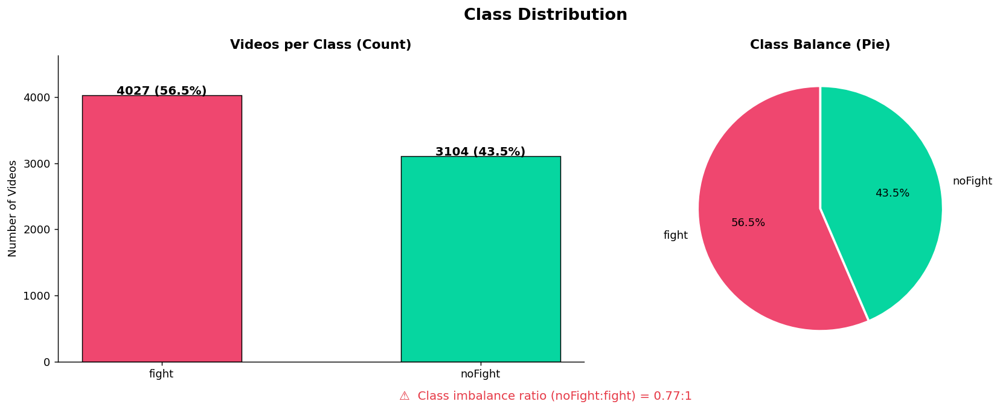

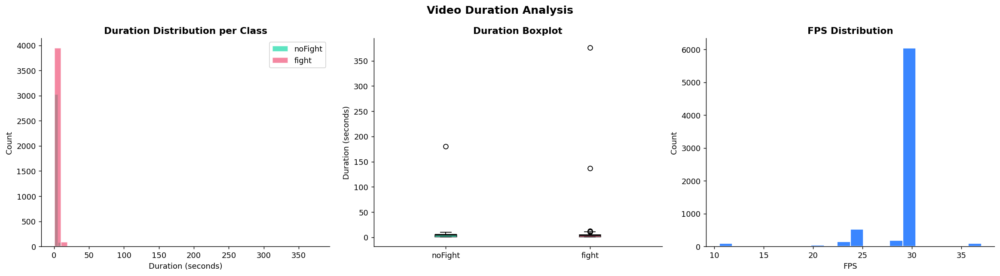

📊 Duration statistics (seconds):
          min  mean  median     max   std
label                                    
fight    0.60  3.50     4.4  375.73  6.66
noFight  0.83  3.83     5.0  179.90  3.65


In [7]:
if not CHECKPOINT_EXISTS:
    COLORS = {'fight': '#EF476F', 'noFight': '#06D6A0'}

    class_counts = valid_df.groupby('label').size().reset_index(name='count')
    total        = class_counts['count'].sum()
    class_counts['pct'] = (class_counts['count'] / total * 100).round(1)

    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    fig.suptitle('Class Distribution', fontsize=15, fontweight='bold')

    bars = axes[0].bar(class_counts['label'], class_counts['count'],
                       color=[COLORS[l] for l in class_counts['label']],
                       edgecolor='black', linewidth=0.8, width=0.5)
    for bar, (_, row) in zip(bars, class_counts.iterrows()):
        axes[0].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 10,
                     f'{row["count"]} ({row["pct"]}%)', ha='center', fontweight='bold', fontsize=11)
    axes[0].set_title('Videos per Class (Count)', fontweight='bold')
    axes[0].set_ylabel('Number of Videos')
    axes[0].set_ylim(0, class_counts['count'].max() * 1.15)

    axes[1].pie(class_counts['count'], labels=class_counts['label'],
                autopct='%1.1f%%', colors=[COLORS[l] for l in class_counts['label']],
                startangle=90, wedgeprops={'edgecolor': 'white', 'linewidth': 2})
    axes[1].set_title('Class Balance (Pie)', fontweight='bold')

    counts = class_counts.set_index('label')['count']
    if 'fight' in counts and 'noFight' in counts:
        ratio = counts['noFight'] / counts['fight']
        fig.text(0.5, -0.02, f'⚠️  Class imbalance ratio (noFight:fight) = {ratio:.2f}:1',
                 ha='center', fontsize=11, color='#E63946')

    plt.tight_layout()
    plt.savefig('eda_class_distribution.png', bbox_inches='tight')
    plt.show()

    # Duration analysis
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    fig.suptitle('Video Duration Analysis', fontsize=14, fontweight='bold')
    for cls in CFG['classes']:
        sub = valid_df[valid_df['label'] == cls]
        axes[0].hist(sub['duration_sec'], bins=40, alpha=0.65, color=COLORS[cls], label=cls, edgecolor='white')
    axes[0].set_title('Duration Distribution per Class', fontweight='bold')
    axes[0].set_xlabel('Duration (seconds)'); axes[0].set_ylabel('Count'); axes[0].legend()
    data_boxes = [valid_df[valid_df['label'] == cls]['duration_sec'].values for cls in CFG['classes']]
    bp = axes[1].boxplot(data_boxes, labels=CFG['classes'], patch_artist=True,
                         medianprops=dict(color='black', lw=2))
    for patch, cls in zip(bp['boxes'], CFG['classes']): patch.set_facecolor(COLORS[cls]); patch.set_alpha(0.7)
    axes[1].set_title('Duration Boxplot', fontweight='bold'); axes[1].set_ylabel('Duration (seconds)')
    axes[2].hist(valid_df['fps'], bins=20, color='#3A86FF', edgecolor='white')
    axes[2].set_title('FPS Distribution', fontweight='bold'); axes[2].set_xlabel('FPS'); axes[2].set_ylabel('Count')
    plt.tight_layout(); plt.savefig('eda_duration_analysis.png', bbox_inches='tight'); plt.show()
    print('📊 Duration statistics (seconds):')
    print(valid_df.groupby('label')['duration_sec'].agg(['min','mean','median','max','std']).round(2))
else:
    print('⏭️  Skipping EDA — checkpoint exists. (Re-run without checkpoint to regenerate EDA plots.)')
    COLORS = {'fight': '#EF476F', 'noFight': '#06D6A0'}


<a id='5'></a>
## 5.  Video Processing & Conversion

In [8]:
import subprocess

def convert_to_mp4(src: str, dst: str) -> bool:
    try:
        cmd = ['ffmpeg', '-y', '-i', src, '-c:v', 'libx264', '-preset', 'veryfast',
               '-crf', '23', '-c:a', 'aac', '-movflags', '+faststart', dst]
        result = subprocess.run(cmd, capture_output=True, timeout=120)
        return result.returncode == 0
    except subprocess.TimeoutExpired:
        log.warning(f'Timeout converting: {src}'); return False
    except Exception as e:
        log.warning(f'Conversion error {src}: {e}'); return False


def process_all_videos(valid_df: pd.DataFrame, cfg: dict) -> pd.DataFrame:
    out_base = Path(cfg['converted_dir'])
    for cls in cfg['classes']: (out_base / cls).mkdir(parents=True, exist_ok=True)
    paths_out = []; convert_count = skip_count = error_count = 0
    for _, row in tqdm(valid_df.iterrows(), total=len(valid_df), desc='Processing videos'):
        src   = row['path']; label = row['label']
        stem  = Path(row['filename']).stem
        dst   = str(out_base / label / f'{stem}.mp4')
        if os.path.exists(dst): paths_out.append(dst); skip_count += 1; continue
        ext = Path(src).suffix.lower()
        if ext == '.mp4':
            try: os.symlink(os.path.realpath(src), dst); paths_out.append(dst); skip_count += 1
            except:
                try: shutil.copy2(src, dst); paths_out.append(dst); skip_count += 1
                except Exception as e: log.warning(f'Failed: {src} → {e}'); paths_out.append(None); error_count += 1
        else:
            ok = convert_to_mp4(src, dst)
            if ok: paths_out.append(dst); convert_count += 1
            else: log.warning(f'Conversion failed: {src}'); paths_out.append(None); error_count += 1
    valid_df = valid_df.copy(); valid_df['converted_path'] = paths_out
    print(f'\n🎬 Video Processing Complete:')
    print(f'   Already MP4 / skipped : {skip_count:5d}')
    print(f'   Converted to MP4      : {convert_count:5d}')
    print(f'   Errors / skipped      : {error_count:5d}')
    return valid_df[valid_df['converted_path'].notna()].copy()


if not CHECKPOINT_EXISTS:
    final_df = process_all_videos(valid_df, CFG)
    print(f'\n✅ Final dataset size: {len(final_df)} videos')
    print(final_df.groupby('label').size())
else:
    print('⏭️  Skipping video conversion — checkpoint exists.')


Processing videos:   0%|          | 0/7131 [00:00<?, ?it/s]


🎬 Video Processing Complete:
   Already MP4 / skipped :  1938
   Converted to MP4      :  5193
   Errors / skipped      :     0

✅ Final dataset size: 7131 videos
label
fight      4027
noFight    3104
dtype: int64


<a id='6'></a>
## 6.  Balance 50/50 & Split Train / Val / Test

In [9]:
if not CHECKPOINT_EXISTS:
    final_df['label_int'] = final_df['label'].map({'noFight': 0, 'fight': 1})
    if CFG['balance_50_50']:
        fight_df   = final_df[final_df['label'] == 'fight']
        nofight_df = final_df[final_df['label'] == 'noFight']
        n_min      = min(len(fight_df), len(nofight_df))
        fight_df   = fight_df.sample(n=n_min, random_state=SEED)
        nofight_df = nofight_df.sample(n=n_min, random_state=SEED)
        balanced_df = pd.concat([fight_df, nofight_df]).sample(frac=1, random_state=SEED).reset_index(drop=True)
        print(f'\n⚖️  Dataset balancé (50/50 strict):')
        print(f'   fight   : {n_min:5d}')
        print(f'   noFight : {n_min:5d}')
        print(f'   TOTAL   : {len(balanced_df):5d}')
    else:
        balanced_df = final_df.copy()

    train_val_df, test_df = train_test_split(
        balanced_df, test_size=CFG['test_ratio'], random_state=SEED, stratify=balanced_df['label_int'])
    val_relative = CFG['val_ratio'] / (CFG['train_ratio'] + CFG['val_ratio'])
    train_df, val_df = train_test_split(
        train_val_df, test_size=val_relative, random_state=SEED, stratify=train_val_df['label_int'])

    def split_summary(name, df):
        n_f = df['label_int'].sum(); n_n = (df['label_int'] == 0).sum()
        ratio = df['label_int'].mean()
        sym = '✅' if 0.45 <= ratio <= 0.55 else '⚠️'
        print(f'   {sym} {name:8s}: {len(df):5d} vidéos | fight={n_f:4d} ({ratio*100:.1f}%) | noFight={n_n:4d}')

    print(f'\n🔀 Split stratifié 3-way:')
    split_summary('Train', train_df); split_summary('Val', val_df); split_summary('Test', test_df)

    # ── Save splits to disk for future sessions ───────────────────────────
    splits_save = {
        'train': train_df[['converted_path', 'label', 'label_int']].to_dict('records'),
        'val'  : val_df  [['converted_path', 'label', 'label_int']].to_dict('records'),
        'test' : test_df [['converted_path', 'label', 'label_int']].to_dict('records'),
    }
    with open(CFG['splits_path'], 'w') as f:
        json.dump(splits_save, f)

    label_map = {'noFight': 0, 'fight': 1}
    with open(CFG['label_map_path'], 'w') as f:
        json.dump(label_map, f)

    print(f'\n💾 Splits saved → {CFG["splits_path"]}')
    print(f'💾 Label map saved → {CFG["label_map_path"]}')

else:
    # ── Load splits from disk ─────────────────────────────────────────────
    if os.path.isfile(CFG['splits_path']):
        with open(CFG['splits_path']) as f:
            splits_save = json.load(f)
        train_df = pd.DataFrame(splits_save['train'])
        val_df   = pd.DataFrame(splits_save['val'])
        test_df  = pd.DataFrame(splits_save['test'])
        print(f'✅ Splits loaded from {CFG["splits_path"]}')
        print(f'   Train : {len(train_df):5d} | Val : {len(val_df):5d} | Test : {len(test_df):5d}')
    else:
        print('⚠️  splits_path not found. Please run the full pipeline once to generate splits.')

    with open(CFG['label_map_path']) as f:
        label_map = json.load(f)
    print(f'✅ Label map loaded: {label_map}')



⚖️  Dataset balancé (50/50 strict):
   fight   :  3104
   noFight :  3104
   TOTAL   :  6208

🔀 Split stratifié 3-way:
   ✅ Train   :  4966 vidéos | fight=2483 (50.0%) | noFight=2483
   ✅ Val     :   621 vidéos | fight= 311 (50.1%) | noFight= 310
   ✅ Test    :   621 vidéos | fight= 310 (49.9%) | noFight= 311

💾 Splits saved → dataset_splits.json
💾 Label map saved → label_map.json


<a id='7'></a>
## 7.  Dataset & DataLoaders

In [10]:
IMG_SIZE  = CFG['img_size']
NORM_MEAN = [0.485, 0.456, 0.406]
NORM_STD  = [0.229, 0.224, 0.225]

train_transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((IMG_SIZE + 24, IMG_SIZE + 24)),
    transforms.RandomCrop(IMG_SIZE),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.05),
    transforms.RandomRotation(10),
    transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.2, hue=0.05),
    transforms.RandomGrayscale(p=0.05),
    transforms.ToTensor(),
    transforms.Normalize(mean=NORM_MEAN, std=NORM_STD),
    transforms.RandomErasing(p=0.1, scale=(0.02, 0.1))
])

val_transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=NORM_MEAN, std=NORM_STD)
])

print('✅ Transforms définis (ImageNet normalization)')


✅ Transforms définis (ImageNet normalization)


In [11]:
class ViolenceDataset(Dataset):
    def __init__(self, dataframe: pd.DataFrame, num_frames: int = 16,
                 transform=None, augment: bool = False):
        self.df         = dataframe.reset_index(drop=True)
        self.num_frames = num_frames
        self.transform  = transform
        self.augment    = augment
        print(f'📁 Dataset: {len(self.df)} videos | '
              f'fight={self.df["label_int"].sum()}, '
              f'noFight={(self.df["label_int"]==0).sum()}')

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx: int):
        row    = self.df.iloc[idx]
        frames = self._load_frames(row['converted_path'])
        if frames is None:
            idx    = (idx + 1) % len(self.df)
            row    = self.df.iloc[idx]
            frames = self._load_frames(row['converted_path'])
        t = self.transform
        frames_t = torch.stack([t(f) for f in frames])
        label    = torch.tensor(row['label_int'], dtype=torch.long)
        return frames_t, label

    def _load_frames(self, path: str):
        try:
            cap   = cv2.VideoCapture(path)
            total = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
            if total <= 0: cap.release(); return None
            indices = set(np.linspace(0, total - 1, self.num_frames).astype(int))
            frames  = []; i = 0
            while True:
                ret, frame = cap.read()
                if not ret: break
                if i in indices: frames.append(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
                i += 1
            cap.release()
            if not frames: return None
            while len(frames) < self.num_frames: frames.append(frames[-1])
            return frames[:self.num_frames]
        except Exception as e:
            log.warning(f'Frame load error {path}: {e}'); return None


train_ds = ViolenceDataset(train_df, CFG['num_frames'], train_transform, augment=True)
val_ds   = ViolenceDataset(val_df,   CFG['num_frames'], val_transform,   augment=False)
test_ds  = ViolenceDataset(test_df,  CFG['num_frames'], val_transform,   augment=False)

labels_train       = train_df['label_int'].values
class_counts_train = np.bincount(labels_train)
class_weights      = 1.0 / class_counts_train
sample_weights     = class_weights[labels_train]

sampler = WeightedRandomSampler(
    weights=torch.DoubleTensor(sample_weights), num_samples=len(train_ds), replacement=True)

train_loader = DataLoader(train_ds, batch_size=CFG['batch_size'], sampler=sampler,
                          num_workers=CFG['num_workers'], pin_memory=True, persistent_workers=True)
val_loader   = DataLoader(val_ds,   batch_size=CFG['batch_size'], shuffle=False,
                          num_workers=CFG['num_workers'], pin_memory=True, persistent_workers=True)
test_loader  = DataLoader(test_ds,  batch_size=CFG['batch_size'], shuffle=False,
                          num_workers=CFG['num_workers'], pin_memory=True, persistent_workers=True)

print(f'\n🔄 DataLoaders prêts:')
print(f'   Train  : {len(train_loader):4d} batches  (WeightedSampler)')
print(f'   Val    : {len(val_loader):4d} batches')
print(f'   Test   : {len(test_loader):4d} batches')
sample_b, sample_l = next(iter(train_loader))
print(f'\n✅ Batch shape : {sample_b.shape}  (B, T, C, H, W)')
del sample_b, sample_l


📁 Dataset: 4966 videos | fight=2483, noFight=2483
📁 Dataset: 621 videos | fight=311, noFight=310
📁 Dataset: 621 videos | fight=310, noFight=311

🔄 DataLoaders prêts:
   Train  :  311 batches  (WeightedSampler)
   Val    :   39 batches
   Test   :   39 batches

✅ Batch shape : torch.Size([16, 16, 3, 224, 224])  (B, T, C, H, W)


<a id='8'></a>
## 8.  Modèle — ResNet18 Pretrained + BiGRU

In [12]:
class ViolenceModel(nn.Module):
    """
    ResNet18 (ImageNet pretrained, finetuned layer3+layer4) as CNN frame extractor
    + 2-layer Bidirectional GRU for temporal modelling.
    Input  : (B, T, C, H, W)  — B=batch, T=16 frames, C=3, H=W=224
    Output : (B, 2)            — logits [noFight, fight]
    """
    def __init__(self, cfg: dict):
        super().__init__()
        resnet = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)
        for p in resnet.parameters(): p.requires_grad = False
        for p in resnet.layer3.parameters(): p.requires_grad = True
        for p in resnet.layer4.parameters(): p.requires_grad = True
        self.cnn = nn.Sequential(*list(resnet.children())[:-1])
        self.gru = nn.GRU(
            input_size=512, hidden_size=cfg['hidden_size'],
            num_layers=cfg['gru_layers'],
            dropout=cfg['dropout'] if cfg['gru_layers'] > 1 else 0,
            batch_first=True, bidirectional=True)
        self.classifier = nn.Sequential(
            nn.Linear(cfg['hidden_size'] * 2, 256),
            nn.BatchNorm1d(256), nn.ReLU(inplace=True),
            nn.Dropout(cfg['fc_dropout']), nn.Linear(256, 2))
        for m in self.classifier.modules():
            if isinstance(m, nn.Linear):
                nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
                if m.bias is not None: nn.init.zeros_(m.bias)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        B, T, C, H, W = x.shape
        x = x.view(B * T, C, H, W)
        x = self.cnn(x).squeeze(-1).squeeze(-1)
        x = x.view(B, T, -1)
        _, h = self.gru(x)
        h = torch.cat((h[-2], h[-1]), dim=1)
        return self.classifier(h)


model = ViolenceModel(CFG).to(DEVICE)
total_p     = sum(p.numel() for p in model.parameters())
trainable_p = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f'\n✅ ViolenceModel (ResNet18 + BiGRU) prêt')
print(f'   Total params     : {total_p:>10,}')
print(f'   Entraînables     : {trainable_p:>10,}  ({100*trainable_p/total_p:.1f}%)')


Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 79.5MB/s]



✅ ViolenceModel (ResNet18 + BiGRU) prêt
   Total params     : 19,316,546
   Entraînables     : 18,633,474  (96.5%)


<a id='9'></a>
## 9.  Training or Load Checkpoint

> **This is the key persistent cell.**  
> - If `CHECKPOINT_EXISTS` → loads weights, optimizer state, history, and all inference variables.  
> - If not → runs the full training loop and saves checkpoints.


In [13]:
# ════════════════════════════════════════════════════════════════════════
#  LOSS / OPTIMIZER / SCHEDULER — always needed
# ════════════════════════════════════════════════════════════════════════

loss_weights = torch.tensor(
    class_weights / class_weights.sum() * len(class_weights), dtype=torch.float32).to(DEVICE)

criterion = nn.CrossEntropyLoss(weight=loss_weights, label_smoothing=CFG['label_smooth'])

optimizer = torch.optim.AdamW(
    filter(lambda p: p.requires_grad, model.parameters()),
    lr=CFG['lr'], weight_decay=CFG['weight_decay'])

def get_lr(epoch):
    if epoch < CFG['warmup_epochs']: return (epoch + 1) / CFG['warmup_epochs']
    return 1.0

warmup_sched = torch.optim.lr_scheduler.LambdaLR(optimizer, lr_lambda=get_lr)
cosine_sched = torch.optim.lr_scheduler.CosineAnnealingLR(
    optimizer, T_max=CFG['epochs'] - CFG['warmup_epochs'], eta_min=1e-6)
scheduler = torch.optim.lr_scheduler.SequentialLR(
    optimizer, schedulers=[warmup_sched, cosine_sched], milestones=[CFG['warmup_epochs']])

scaler = torch.amp.GradScaler('cuda')


In [14]:
# ════════════════════════════════════════════════════════════════════════
#  TRAINING LOOP  (skipped if checkpoint found)
# ════════════════════════════════════════════════════════════════════════

if not CHECKPOINT_EXISTS:
    history = {
        'train_loss': [], 'train_acc': [],
        'val_loss'  : [], 'val_acc'  : [],
        'lr'        : [], 'acc_gap'  : [], 'loss_gap': []
    }
    best_val_acc = 0.0; best_epoch = 0; patience_ctr = 0

    for epoch in range(1, CFG['epochs'] + 1):
        t0 = time.time()

        # ── Train ──────────────────────────────────────────────────────
        model.train()
        tr_loss = tr_correct = tr_total = 0
        for i, (frames, labels) in enumerate(train_loader):
            frames, labels = frames.to(DEVICE), labels.to(DEVICE)
            optimizer.zero_grad()
            with torch.amp.autocast('cuda'):
                out  = model(frames); loss = criterion(out, labels)
            scaler.scale(loss).backward()
            scaler.unscale_(optimizer)
            torch.nn.utils.clip_grad_norm_(model.parameters(), CFG['grad_clip'])
            scaler.step(optimizer); scaler.update()
            tr_loss    += loss.item() * labels.size(0)
            tr_correct += (out.argmax(1) == labels).sum().item()
            tr_total   += labels.size(0)
            if i % 10 == 0:
                print(f'  Epoch {epoch:02d} | Batch {i:3d}/{len(train_loader)} | Loss {loss.item():.4f}', end='\r')

        train_loss = tr_loss / tr_total; train_acc = tr_correct / tr_total

        # ── Validation ─────────────────────────────────────────────────
        model.eval()
        vl_loss = vl_correct = vl_total = 0
        with torch.no_grad():
            for frames, labels in val_loader:
                frames, labels = frames.to(DEVICE), labels.to(DEVICE)
                with torch.amp.autocast('cuda'):
                    out  = model(frames); loss = criterion(out, labels)
                vl_loss    += loss.item() * labels.size(0)
                vl_correct += (out.argmax(1) == labels).sum().item()
                vl_total   += labels.size(0)

        val_loss = vl_loss / vl_total; val_acc = vl_correct / vl_total
        scheduler.step()
        current_lr = optimizer.param_groups[0]['lr']
        acc_gap    = train_acc - val_acc; loss_gap = val_loss - train_loss
        overfit_sym = '🔴 OVERFIT' if acc_gap > CFG['overfitting_gap'] else '🟢 OK'

        history['train_loss'].append(train_loss); history['train_acc'].append(train_acc)
        history['val_loss'  ].append(val_loss);   history['val_acc'  ].append(val_acc)
        history['lr'        ].append(current_lr); history['acc_gap'  ].append(float(acc_gap))
        history['loss_gap'  ].append(float(loss_gap))

        elapsed = time.time() - t0
        print(f'Epoch {epoch:02d}/{CFG["epochs"]} | Train {train_loss:.4f}/{train_acc:.4f} | '
              f'Val {val_loss:.4f}/{val_acc:.4f} | Gap {acc_gap:+.4f} {overfit_sym} | '
              f'LR {current_lr:.2e} | {elapsed:.1f}s')

        # ── Save BEST checkpoint ───────────────────────────────────────
        if val_acc > best_val_acc:
            best_val_acc = val_acc; best_epoch = epoch; patience_ctr = 0
            torch.save({
                'model_state_dict' : model.state_dict(),
                'optimizer_state'  : optimizer.state_dict(),
                'epoch'            : epoch,
                'best_val_acc'     : best_val_acc,
                'history'          : history,
                'cfg'              : CFG,
                'classes'          : CFG['classes'],
            }, CFG['best_model_path'])
            print(f'  💾 Best model saved  val_acc={best_val_acc:.4f}')
        else:
            patience_ctr += 1
            if patience_ctr >= CFG['patience']:
                print(f'  ⛔ Early stopping at epoch {epoch}'); break

        # ── Save LAST checkpoint every epoch ─────────────────────────
        torch.save({
            'model_state_dict' : model.state_dict(),
            'optimizer_state'  : optimizer.state_dict(),
            'epoch'            : epoch,
            'best_val_acc'     : best_val_acc,
            'history'          : history,
            'cfg'              : CFG,
            'classes'          : CFG['classes'],
        }, CFG['last_ckpt_path'])

    with open(CFG['history_path'], 'w') as f:
        json.dump(history, f)

    print(f'\n🏆 Best Val Acc : {best_val_acc:.4f}  (epoch {best_epoch})')
    print(f'💾 History saved → {CFG["history_path"]}')

# ════════════════════════════════════════════════════════════════════════
#  LOAD CHECKPOINT (when CHECKPOINT_EXISTS or after training above)
# ════════════════════════════════════════════════════════════════════════

ckpt = torch.load(CFG['best_model_path'], map_location=DEVICE)
model.load_state_dict(ckpt['model_state_dict'])
model.eval()

best_val_acc = ckpt.get('best_val_acc', 0.0)
best_epoch   = ckpt.get('epoch', 0)

# Load history — from checkpoint or from JSON file
if 'history' in ckpt:
    history = ckpt['history']
elif os.path.isfile(CFG['history_path']):
    with open(CFG['history_path']) as f:
        history = json.load(f)
else:
    history = {'train_loss': [], 'train_acc': [], 'val_loss': [],
               'val_acc': [], 'lr': [], 'acc_gap': [], 'loss_gap': []}

print(f'\n✅ Checkpoint loaded:')
print(f'   Best Val Acc : {best_val_acc:.4f}  (epoch {best_epoch})')
print(f'   History len  : {len(history["train_loss"])} epochs')
print(f'   Model ready for: evaluation / XAI / inference / new experiments')


[h264 @ 0x1cd24a80] mb_type 104 in P slice too large at 98 31
[h264 @ 0x1cd24a80] error while decoding MB 98 31


Epoch 01/24 | Train 5.1223/0.6716 | Val 3.2192/0.8164 | Gap -0.1449 🟢 OK | LR 6.67e-05 | 1002.1s
  💾 Best model saved  val_acc=0.8164


[h264 @ 0x1cecee40] mb_type 104 in P slice too large at 98 31
[h264 @ 0x1cecee40] error while decoding MB 98 31


Epoch 02/24 | Train 3.8567/0.7517 | Val 2.5177/0.8422 | Gap -0.0905 🟢 OK | LR 1.00e-04 | 942.9s
  💾 Best model saved  val_acc=0.8422


[h264 @ 0x1ced6bc0] mb_type 104 in P slice too large at 98 31
[h264 @ 0x1ced6bc0] error while decoding MB 98 31


Epoch 03/24 | Train 3.0752/0.7606 | Val 2.0280/0.8422 | Gap -0.0816 🟢 OK | LR 1.00e-04 | 944.8s


[h264 @ 0x1cd23dc0] mb_type 104 in P slice too large at 98 31
[h264 @ 0x1cd23dc0] error while decoding MB 98 31


[h264 @ 0x2a631c40] mb_type 104 in P slice too large at 98 31
[h264 @ 0x2a631c40] error while decoding MB 98 31


Epoch 04/24 | Train 2.2939/0.7604 | Val 1.4037/0.8744 | Gap -0.1140 🟢 OK | LR 9.94e-05 | 972.8s
  💾 Best model saved  val_acc=0.8744
Epoch 05/24 | Train 1.8160/0.7954 | Val 1.3353/0.8100 | Gap -0.0146 🟢 OK | LR 9.78e-05 | 930.8s


[h264 @ 0x1cd23540] mb_type 104 in P slice too large at 98 31
[h264 @ 0x1cd23540] error while decoding MB 98 31


Epoch 06/24 | Train 1.7482/0.8113 | Val 1.3165/0.8019 | Gap +0.0094 🟢 OK | LR 9.51e-05 | 939.4s
Epoch 07/24 | Train 1.7225/0.8443 | Val 1.0281/0.8712 | Gap -0.0268 🟢 OK | LR 9.14e-05 | 913.8s
Epoch 08/24 | Train 1.3745/0.8486 | Val 0.9333/0.8132 | Gap +0.0354 🟢 OK | LR 8.68e-05 | 938.6s


[h264 @ 0x1cd24880] mb_type 104 in P slice too large at 98 31
[h264 @ 0x1cd24880] error while decoding MB 98 31


Epoch 09/24 | Train 1.3692/0.8510 | Val 0.8831/0.8663 | Gap -0.0154 🟢 OK | LR 8.14e-05 | 1012.3s


[h264 @ 0x1cd23540] mb_type 104 in P slice too large at 98 31
[h264 @ 0x1cd23540] error while decoding MB 98 31


Epoch 10/24 | Train 1.1805/0.8741 | Val 0.6812/0.9082 | Gap -0.0341 🟢 OK | LR 7.52e-05 | 927.7s
  💾 Best model saved  val_acc=0.9082


[h264 @ 0x1d298d00] mb_type 104 in P slice too large at 98 31
[h264 @ 0x1d298d00] error while decoding MB 98 31


[h264 @ 0x1ced6bc0] mb_type 104 in P slice too large at 98 31
[h264 @ 0x1ced6bc0] error while decoding MB 98 31


[h264 @ 0x1cecdd40] mb_type 104 in P slice too large at 98 31
[h264 @ 0x1cecdd40] error while decoding MB 98 31


[h264 @ 0x1d224240] mb_type 104 in P slice too large at 98 31
[h264 @ 0x1d224240] error while decoding MB 98 31


Epoch 11/24 | Train 1.2418/0.8725 | Val 0.8663/0.9259 | Gap -0.0534 🟢 OK | LR 6.86e-05 | 961.3s
  💾 Best model saved  val_acc=0.9259


[h264 @ 0x1cd24440] mb_type 104 in P slice too large at 98 31
[h264 @ 0x1cd24440] error while decoding MB 98 31


Epoch 12/24 | Train 1.1528/0.8808 | Val 0.6959/0.9163 | Gap -0.0355 🟢 OK | LR 6.15e-05 | 949.5s
Epoch 13/24 | Train 1.0673/0.8951 | Val 0.7904/0.9002 | Gap -0.0051 🟢 OK | LR 5.42e-05 | 954.0s


[h264 @ 0x1d2b6f00] mb_type 104 in P slice too large at 98 31
[h264 @ 0x1d2b6f00] error while decoding MB 98 31


Epoch 14/24 | Train 1.1196/0.8953 | Val 0.5876/0.9243 | Gap -0.0290 🟢 OK | LR 4.68e-05 | 940.5s
Epoch 15/24 | Train 1.0741/0.9088 | Val 0.6326/0.9291 | Gap -0.0204 🟢 OK | LR 3.95e-05 | 932.4s
  💾 Best model saved  val_acc=0.9291


[h264 @ 0x1d2d86c0] mb_type 104 in P slice too large at 98 31
[h264 @ 0x1d2d86c0] error while decoding MB 98 31


Epoch 16/24 | Train 1.1139/0.9152 | Val 0.6904/0.9259 | Gap -0.0107 🟢 OK | LR 3.24e-05 | 936.3s
Epoch 17/24 | Train 1.0740/0.9217 | Val 0.7323/0.9356 | Gap -0.0139 🟢 OK | LR 2.58e-05 | 919.5s
  💾 Best model saved  val_acc=0.9356


[h264 @ 0x1cd23540] mb_type 104 in P slice too large at 98 31
[h264 @ 0x1cd23540] error while decoding MB 98 31


[h264 @ 0x1ced7680] mb_type 104 in P slice too large at 98 31
[h264 @ 0x1ced7680] error while decoding MB 98 31


Epoch 18/24 | Train 1.0275/0.9259 | Val 0.6291/0.9388 | Gap -0.0129 🟢 OK | LR 1.96e-05 | 950.7s
  💾 Best model saved  val_acc=0.9388
Epoch 19/24 | Train 0.9345/0.9311 | Val 0.5276/0.9436 | Gap -0.0125 🟢 OK | LR 1.42e-05 | 964.0s
  💾 Best model saved  val_acc=0.9436
Epoch 20/24 | Train 0.9126/0.9352 | Val 0.6006/0.9291 | Gap +0.0060 🟢 OK | LR 9.60e-06 | 967.6s


[h264 @ 0x1cd24200] mb_type 104 in P slice too large at 98 31
[h264 @ 0x1cd24200] error while decoding MB 98 31


[h264 @ 0x1cd24440] mb_type 104 in P slice too large at 98 31
[h264 @ 0x1cd24440] error while decoding MB 98 31


Epoch 21/24 | Train 0.9945/0.9289 | Val 0.6662/0.9436 | Gap -0.0147 🟢 OK | LR 5.90e-06 | 921.1s


[h264 @ 0x1d2d86c0] mb_type 104 in P slice too large at 98 31
[h264 @ 0x1d2d86c0] error while decoding MB 98 31


[h264 @ 0x1cdc8200] mb_type 104 in P slice too large at 98 31
[h264 @ 0x1cdc8200] error while decoding MB 98 31


Epoch 22/24 | Train 1.0681/0.9303 | Val 0.4711/0.9436 | Gap -0.0133 🟢 OK | LR 3.20e-06 | 935.3s
Epoch 23/24 | Train 0.9561/0.9348 | Val 0.6372/0.9372 | Gap -0.0024 🟢 OK | LR 1.55e-06 | 944.8s


[h264 @ 0x1d224440] mb_type 104 in P slice too large at 98 31
[h264 @ 0x1d224440] error while decoding MB 98 31


Epoch 24/24 | Train 0.9634/0.9360 | Val 0.5085/0.9356 | Gap +0.0004 🟢 OK | LR 1.00e-06 | 932.8s

🏆 Best Val Acc : 0.9436  (epoch 19)
💾 History saved → training_history.json

✅ Checkpoint loaded:
   Best Val Acc : 0.9436  (epoch 19)
   History len  : 19 epochs
   Model ready for: evaluation / XAI / inference / new experiments


<a id='10'></a>
## 10.  Détection d'Overfitting — Dashboard

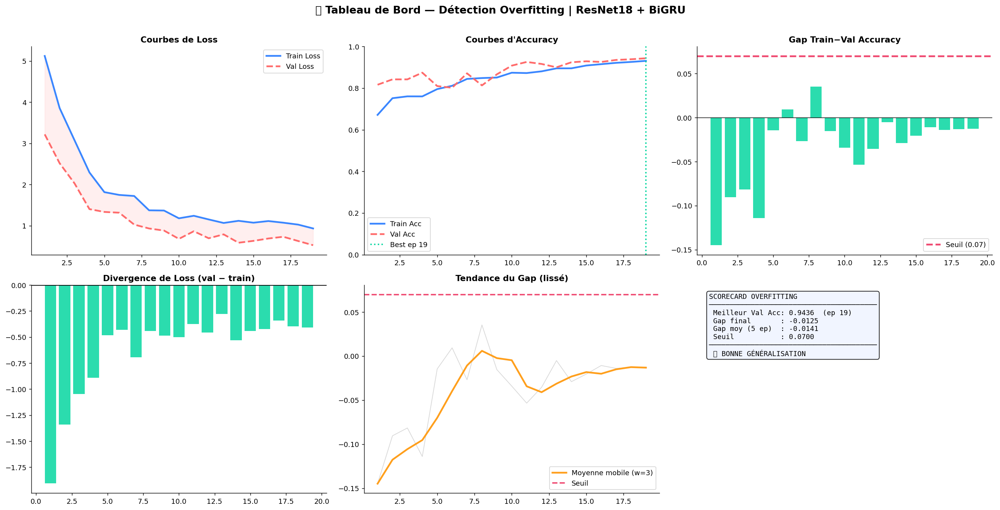


════════════════════════════════════════════════════
  🟢 BONNE GÉNÉRALISATION
  Gap moyen: -0.0141
════════════════════════════════════════════════════


In [15]:
if len(history['train_loss']) > 0:
    ep         = range(1, len(history['train_loss']) + 1)
    gap_vals   = history['acc_gap']
    GAP_THRESH = CFG['overfitting_gap']

    fig, axes = plt.subplots(2, 3, figsize=(20, 10))
    fig.suptitle('🔬 Tableau de Bord — Détection Overfitting | ResNet18 + BiGRU',
                 fontsize=15, fontweight='bold', y=1.01)

    ax = axes[0, 0]
    ax.plot(ep, history['train_loss'], color='#3A86FF', lw=2.5, label='Train Loss')
    ax.plot(ep, history['val_loss'],   color='#FF6B6B', lw=2.5, linestyle='--', label='Val Loss')
    ax.fill_between(ep, history['train_loss'], history['val_loss'], alpha=0.10, color='#FF6B6B')
    ax.set_title('Courbes de Loss', fontweight='bold', fontsize=12); ax.legend()

    ax = axes[0, 1]
    ax.plot(ep, history['train_acc'], color='#3A86FF', lw=2.5, label='Train Acc')
    ax.plot(ep, history['val_acc'],   color='#FF6B6B', lw=2.5, linestyle='--', label='Val Acc')
    best_e = int(np.argmax(history['val_acc'])) + 1
    ax.axvline(best_e, color='#06D6A0', lw=2, linestyle=':', label=f'Best ep {best_e}')
    ax.set_ylim(0, 1); ax.set_title('Courbes d\'Accuracy', fontweight='bold', fontsize=12); ax.legend()

    ax = axes[0, 2]
    bar_cols = ['#EF476F' if g > GAP_THRESH else '#06D6A0' for g in gap_vals]
    ax.bar(ep, gap_vals, color=bar_cols, alpha=0.85, edgecolor='none')
    ax.axhline(GAP_THRESH, color='#EF476F', lw=2.5, linestyle='--', label=f'Seuil ({GAP_THRESH})')
    ax.axhline(0, color='black', lw=0.8); ax.set_title('Gap Train−Val Accuracy', fontweight='bold', fontsize=12); ax.legend()

    ax = axes[1, 0]
    diverging  = np.array(history['val_loss']) - np.array(history['train_loss'])
    div_colors = ['#EF476F' if d > 0 else '#06D6A0' for d in diverging]
    ax.bar(ep, diverging, color=div_colors, alpha=0.85, edgecolor='none')
    ax.axhline(0, color='black', lw=1.5); ax.set_title('Divergence de Loss (val − train)', fontweight='bold', fontsize=12)

    ax = axes[1, 1]
    window  = max(3, len(gap_vals) // 5)
    rolling = pd.Series(gap_vals).rolling(window, min_periods=1).mean().values
    ax.plot(ep, gap_vals, alpha=0.3, color='gray', lw=1)
    ax.plot(ep, rolling, color='#FF9F1C', lw=2.5, label=f'Moyenne mobile (w={window})')
    ax.axhline(GAP_THRESH, color='#EF476F', lw=2, linestyle='--', label='Seuil')
    ax.set_title('Tendance du Gap (lissé)', fontweight='bold', fontsize=12); ax.legend()

    ax = axes[1, 2]; ax.axis('off')
    final_gap     = gap_vals[-1] if gap_vals else 0
    avg_gap_last5 = float(np.mean(gap_vals[-5:])) if len(gap_vals) >= 5 else float(np.mean(gap_vals))
    best_val      = max(history['val_acc'])
    if avg_gap_last5 > GAP_THRESH * 1.5:   diag = '🔴 OVERFITTING FORT'
    elif avg_gap_last5 > GAP_THRESH:       diag = '🟡 OVERFITTING MODÉRÉ'
    elif avg_gap_last5 < 0.01 and best_val < 0.70: diag = '🔵 SOUS-APPRENTISSAGE'
    else:                                  diag = '🟢 BONNE GÉNÉRALISATION'

    card = (f'SCORECARD OVERFITTING\n{"─"*40}\n'
            f' Meilleur Val Acc: {best_val:.4f}  (ep {best_e})\n'
            f' Gap final       : {final_gap:+.4f}\n'
            f' Gap moy (5 ep)  : {avg_gap_last5:+.4f}\n'
            f' Seuil           : {GAP_THRESH:.4f}\n'
            f'{"─"*40}\n {diag}')
    ax.text(0.04, 0.96, card, transform=ax.transAxes, fontsize=10,
            verticalalignment='top', fontfamily='monospace',
            bbox=dict(boxstyle='round', facecolor='#F0F4FF', alpha=0.9))

    plt.tight_layout(); plt.savefig('overfitting_dashboard.png', bbox_inches='tight'); plt.show()
    print(f'\n{"═"*52}\n  {diag}\n  Gap moyen: {avg_gap_last5:+.4f}\n{"═"*52}')
else:
    print('⚠️  No training history available to plot.')


<a id='11'></a>
## 11. Évaluation & Métriques

In [16]:
def collect_predictions(model, loader, device):
    preds, labels_all, probs = [], [], []
    model.eval()
    with torch.no_grad():
        for frames, lbs in tqdm(loader, desc='Prédictions'):
            frames = frames.to(device)
            with torch.amp.autocast('cuda'):
                out = model(frames)
            probs.extend(torch.softmax(out, dim=1)[:, 1].cpu().numpy())
            preds.extend(out.argmax(1).cpu().numpy())
            labels_all.extend(lbs.numpy())
    return np.array(labels_all), np.array(preds), np.array(probs)


val_labels, val_preds, val_probs = collect_predictions(model, val_loader, DEVICE)
print(f'Val : {len(val_labels)} échantillons collectés')


Prédictions:   0%|          | 0/39 [00:00<?, ?it/s]

Val : 621 échantillons collectés


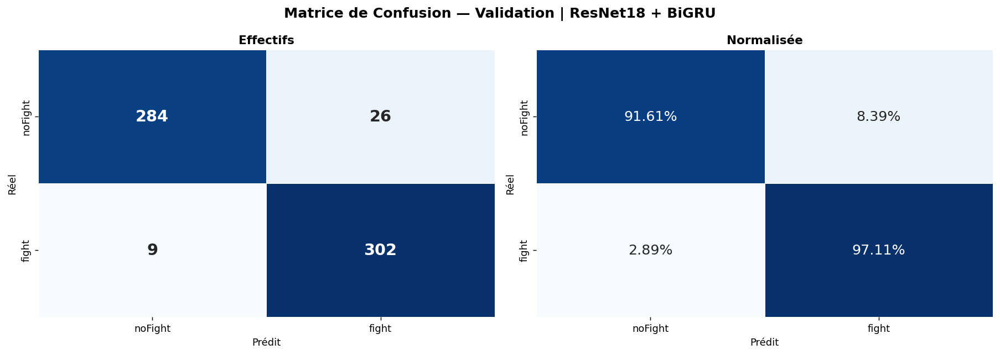


📋 Rapport de Classification — Validation:
              precision    recall  f1-score   support

     noFight     0.9693    0.9161    0.9420       310
       fight     0.9207    0.9711    0.9452       311

    accuracy                         0.9436       621
   macro avg     0.9450    0.9436    0.9436       621
weighted avg     0.9450    0.9436    0.9436       621

  AUC-ROC     : 0.9787
  AUC-PR      : 0.9700
  Sensitivité : 0.9711
  Spécificité : 0.9161


In [17]:
# ── Confusion Matrix ──────────────────────────────────────────────────
cm = confusion_matrix(val_labels, val_preds)
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle('Matrice de Confusion — Validation | ResNet18 + BiGRU', fontsize=14, fontweight='bold')
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=CFG['classes'],
            yticklabels=CFG['classes'], ax=axes[0], linewidths=.5, cbar=False,
            annot_kws={'size': 16, 'weight': 'bold'})
axes[0].set_title('Effectifs', fontweight='bold'); axes[0].set_xlabel('Prédit'); axes[0].set_ylabel('Réel')
cm_norm = cm.astype(float) / cm.sum(axis=1, keepdims=True)
sns.heatmap(cm_norm, annot=True, fmt='.2%', cmap='Blues', xticklabels=CFG['classes'],
            yticklabels=CFG['classes'], ax=axes[1], linewidths=.5, cbar=False, annot_kws={'size': 14})
axes[1].set_title('Normalisée', fontweight='bold'); axes[1].set_xlabel('Prédit'); axes[1].set_ylabel('Réel')
plt.tight_layout(); plt.savefig('val_confusion_matrix.png', bbox_inches='tight'); plt.show()

tn, fp, fn, tp = cm.ravel()
auc_roc = roc_auc_score(val_labels, val_probs)
auc_pr  = average_precision_score(val_labels, val_probs)
print('\n📋 Rapport de Classification — Validation:')
print(classification_report(val_labels, val_preds, target_names=CFG['classes'], digits=4))
print(f'  AUC-ROC     : {auc_roc:.4f}')
print(f'  AUC-PR      : {auc_pr:.4f}')
print(f'  Sensitivité : {tp/(tp+fn):.4f}')
print(f'  Spécificité : {tn/(tn+fp):.4f}')


In [18]:
# ── Test Set Evaluation ──────────────────────────────────────────────
test_labels, test_preds, test_probs = collect_predictions(model, test_loader, DEVICE)
cm_test = confusion_matrix(test_labels, test_preds)
tn2, fp2, fn2, tp2 = cm_test.ravel()
test_acc  = (tp2 + tn2) / len(test_labels)
test_auc  = roc_auc_score(test_labels, test_probs)
test_ap   = average_precision_score(test_labels, test_probs)
test_sens = tp2 / (tp2 + fn2)
test_spec = tn2 / (tn2 + fp2)

print('\n' + '═'*58)
print('  🧪 RÉSULTATS FINAUX — TEST SET (ResNet18 + BiGRU)')
print('═'*58)
print(f'  Accuracy    : {test_acc:.4f}')
print(f'  AUC-ROC     : {test_auc:.4f}')
print(f'  AUC-PR      : {test_ap:.4f}')
print(f'  Sensitivité : {test_sens:.4f}')
print(f'  Spécificité : {test_spec:.4f}')
print('═'*58)
print(classification_report(test_labels, test_preds, target_names=CFG['classes'], digits=4))


Prédictions:   0%|          | 0/39 [00:00<?, ?it/s]


══════════════════════════════════════════════════════════
  🧪 RÉSULTATS FINAUX — TEST SET (ResNet18 + BiGRU)
══════════════════════════════════════════════════════════
  Accuracy    : 0.9291
  AUC-ROC     : 0.9738
  AUC-PR      : 0.9655
  Sensitivité : 0.9516
  Spécificité : 0.9068
══════════════════════════════════════════════════════════
              precision    recall  f1-score   support

     noFight     0.9495    0.9068    0.9276       311
       fight     0.9105    0.9516    0.9306       310

    accuracy                         0.9291       621
   macro avg     0.9300    0.9292    0.9291       621
weighted avg     0.9300    0.9291    0.9291       621



<a id='12'></a>
## 12. Explainable AI — Grad-CAM

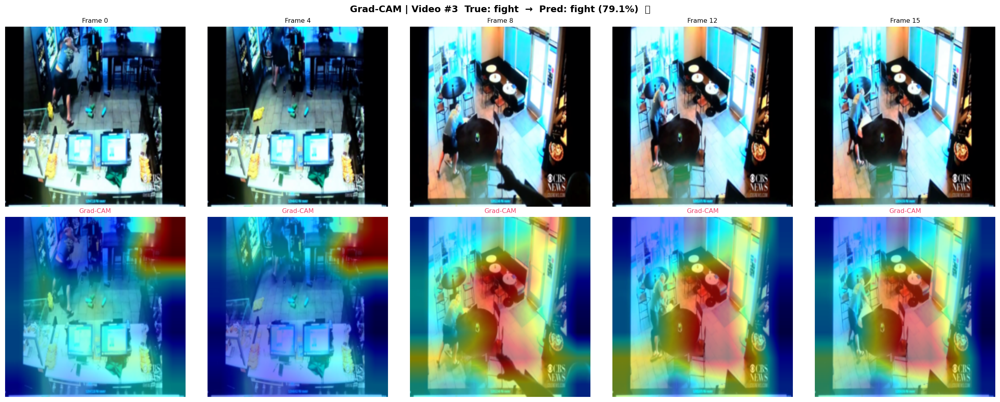

  Video   3 | True=fight      Pred=fight      Conf=79.05%  ✅


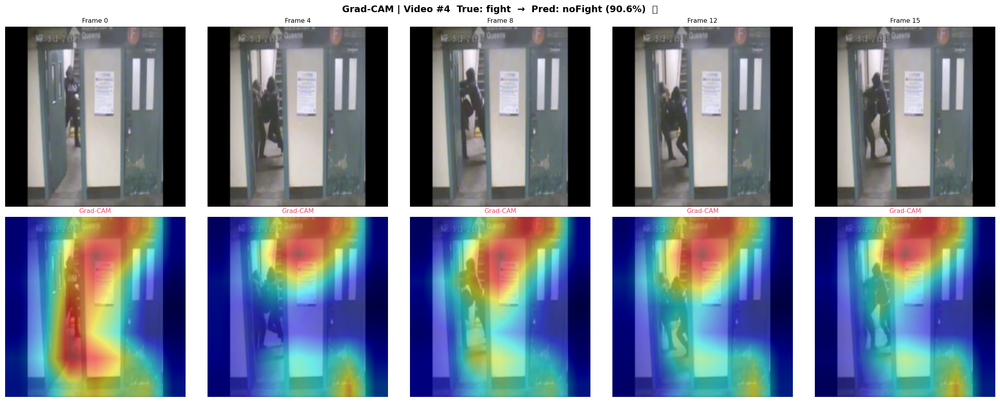

  Video   4 | True=fight      Pred=noFight    Conf=90.62%  ❌


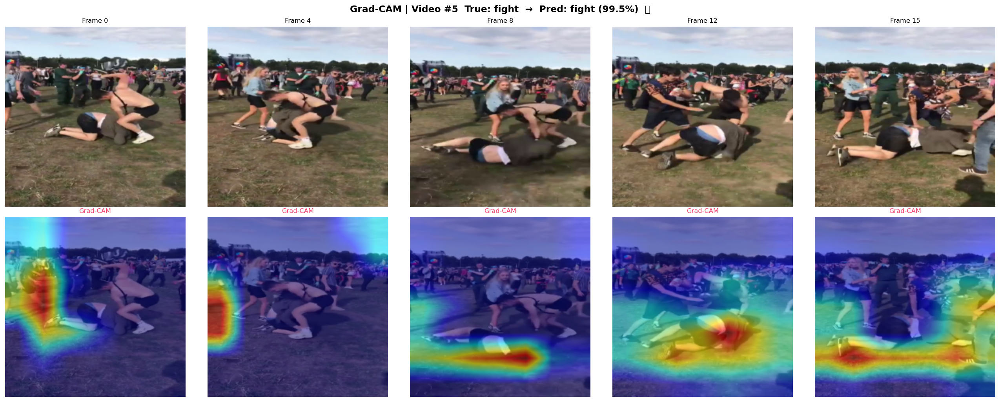

  Video   5 | True=fight      Pred=fight      Conf=99.51%  ✅


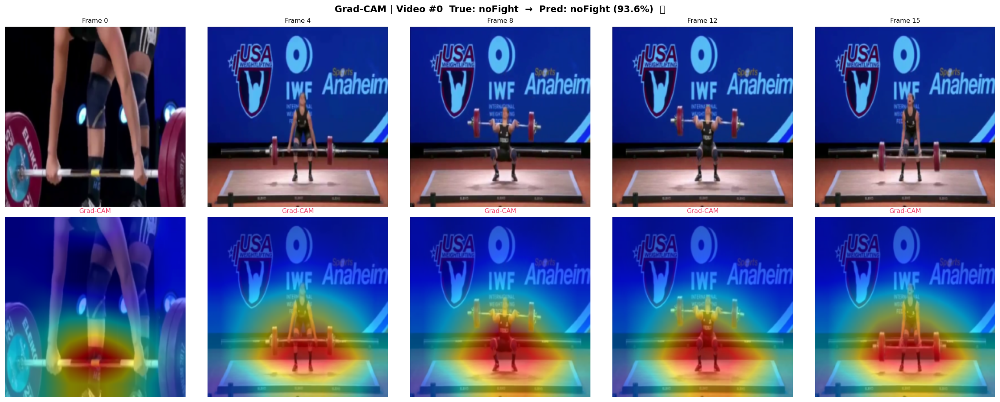

  Video   0 | True=noFight    Pred=noFight    Conf=93.55%  ✅


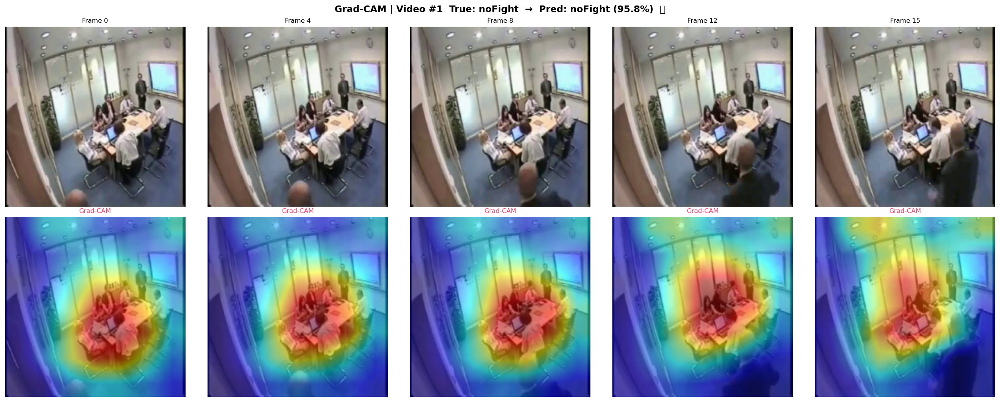

  Video   1 | True=noFight    Pred=noFight    Conf=95.75%  ✅


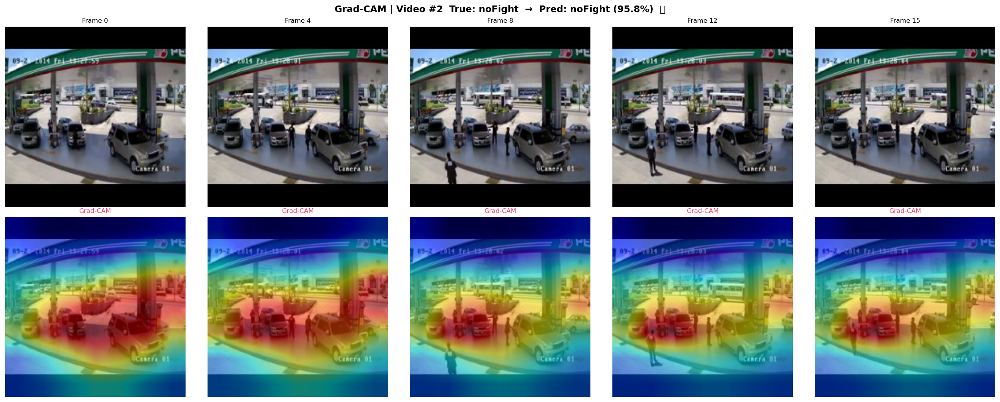

  Video   2 | True=noFight    Pred=noFight    Conf=95.85%  ✅
✅ Grad-CAM initialized on layer4[-1]


In [19]:
class SingleFrameCNN(nn.Module):
    def __init__(self, full_model):
        super().__init__()
        self.cnn = full_model.cnn
    def forward(self, x):
        return self.cnn(x).squeeze(-1).squeeze(-1)

cnn_wrapper  = SingleFrameCNN(model).to(DEVICE).eval()
target_layer = [model.cnn[-2][-1]]
cam          = GradCAM(model=cnn_wrapper, target_layers=target_layer)

NORM_MEAN_NP = np.array([0.485, 0.456, 0.406])
NORM_STD_NP  = np.array([0.229, 0.224, 0.225])

def denormalize(tensor: torch.Tensor) -> np.ndarray:
    img = tensor.cpu().numpy().transpose(1, 2, 0)
    img = img * NORM_STD_NP + NORM_MEAN_NP
    return np.clip(img, 0, 1).astype(np.float32)

FRAMES_TO_SHOW = [0, 4, 8, 12, 15]

def gradcam_video(video_idx: int, dataset: ViolenceDataset, frames_to_show=FRAMES_TO_SHOW):
    frames, label = dataset[video_idx]
    with torch.no_grad():
        inp = frames.unsqueeze(0).to(DEVICE)
        with torch.amp.autocast('cuda'): out = model(inp)
    pred = out.argmax(1).item(); conf = torch.softmax(out, dim=1)[0, pred].item()
    true_name = CFG['classes'][label.item()]; pred_name = CFG['classes'][pred]
    correct   = '✅' if label.item() == pred else '❌'
    n = len(frames_to_show); fig, axes = plt.subplots(2, n, figsize=(4 * n, 8))
    fig.suptitle(f'Grad-CAM | Video #{video_idx}  True: {true_name}  →  Pred: {pred_name} ({conf*100:.1f}%)  {correct}',
                 fontsize=13, fontweight='bold')
    for col, fi in enumerate(frames_to_show):
        frame_tensor  = frames[fi].unsqueeze(0).to(DEVICE)
        grayscale_cam = cam(input_tensor=frame_tensor, targets=[ClassifierOutputTarget(pred)])[0]
        rgb_img       = denormalize(frames[fi])
        overlay       = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True)
        axes[0, col].imshow(rgb_img); axes[0, col].set_title(f'Frame {fi}', fontsize=9); axes[0, col].axis('off')
        axes[1, col].imshow(overlay); axes[1, col].set_title('Grad-CAM', fontsize=9, color='#EF476F'); axes[1, col].axis('off')
    plt.tight_layout()
    return fig, pred_name, true_name, conf, correct

fight_ds_idx   = [i for i in range(len(val_ds)) if val_ds.df.iloc[i]['label'] == 'fight'][:3]
nofight_ds_idx = [i for i in range(len(val_ds)) if val_ds.df.iloc[i]['label'] == 'noFight'][:3]
sample_indices = fight_ds_idx + nofight_ds_idx

for idx in sample_indices:
    fig, pred_name, true_name, conf, ok = gradcam_video(idx, val_ds)
    fig.savefig(f'gradcam_video_{idx}.png', bbox_inches='tight')
    plt.show()
    print(f'  Video {idx:3d} | True={true_name:10s} Pred={pred_name:10s} Conf={conf:.2%}  {ok}')

print('✅ Grad-CAM initialized on layer4[-1]')


##  Inference on New Videos

> Use this cell to run inference on any new video file without retraining.


In [20]:
def predict_video(video_path: str, model: nn.Module, device, cfg: dict,
                  transform=None) -> dict:
    """
    Run inference on a single video file.
    Returns: {'label': str, 'confidence': float, 'probs': {'noFight': float, 'fight': float}}
    """
    if transform is None:
        transform = val_transform

    cap   = cv2.VideoCapture(video_path)
    total = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    if total <= 0:
        cap.release()
        return {'error': 'Cannot read video'}

    indices = set(np.linspace(0, total - 1, cfg['num_frames']).astype(int))
    frames  = []; i = 0

    while True:
        ret, frame = cap.read()
        if not ret: break
        if i in indices: frames.append(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
        i += 1
    cap.release()

    while len(frames) < cfg['num_frames']: frames.append(frames[-1])
    frames = frames[:cfg['num_frames']]

    frames_t = torch.stack([transform(f) for f in frames]).unsqueeze(0).to(device)  # (1, T, C, H, W)

    model.eval()
    with torch.no_grad():
        with torch.amp.autocast('cuda'):
            logits = model(frames_t)
        probs = torch.softmax(logits, dim=1)[0].cpu().numpy()

    pred  = int(probs.argmax())
    label = cfg['classes'][pred]

    return {
        'label'      : label,
        'confidence' : float(probs[pred]),
        'probs'      : {cfg['classes'][i]: float(probs[i]) for i in range(len(cfg['classes']))}
    }


# ── Example usage ────────────────────────────────────────────────────────────
# result = predict_video('/path/to/your/video.mp4', model, DEVICE, CFG)
# print(f'Prediction: {result["label"]}  ({result["confidence"]:.2%})')
# print(f'Probs: {result["probs"]}')

print('✅ predict_video() function ready.')
print('   Usage: result = predict_video("path/to/video.mp4", model, DEVICE, CFG)')


✅ predict_video() function ready.
   Usage: result = predict_video("path/to/video.mp4", model, DEVICE, CFG)


In [21]:
def batch_predict_folder(folder: str, model: nn.Module, cfg: dict, device) -> pd.DataFrame:
    """Run inference on all videos in a folder. Returns a DataFrame."""
    results = []
    video_exts = cfg['video_exts']
    files = [f for f in Path(folder).rglob('*') if f.suffix.lower() in video_exts]
    for fpath in tqdm(files, desc='Batch inference'):
        r = predict_video(str(fpath), model, device, cfg)
        r['filename'] = fpath.name
        results.append(r)
    return pd.DataFrame(results)


# ── Example ────────────────────────────────────────────────────────────────
# df_results = batch_predict_folder('/path/to/test_videos/', model, CFG, DEVICE)
# print(df_results)

print('✅ batch_predict_folder() function ready.')


✅ batch_predict_folder() function ready.


<a id='13'></a>
## 13.  Sauvegarde du Modèle

In [22]:
# ════════════════════════════════════════════════════════════════════════
#  SAVE COMPLETE CHECKPOINT (versioned with timestamp to avoid overwrites)
# ════════════════════════════════════════════════════════════════════════

versioned_path = f'model_resnet18_bigru_{TIMESTAMP}.pth'

save_dict = {
    'model_state_dict' : model.state_dict(),
    'optimizer_state'  : optimizer.state_dict(),
    'model_class'      : 'ViolenceModel',
    'architecture'     : 'ResNet18 (ImageNet pretrained, layer3+4 finetuned) + BiGRU (2 layers)',
    'num_frames'       : CFG['num_frames'],
    'img_size'         : CFG['img_size'],
    'classes'          : CFG['classes'],
    'best_val_acc'     : best_val_acc,
    'best_epoch'       : best_epoch,
    'test_acc'         : float(test_acc)  if 'test_acc'  in dir() else None,
    'test_auc_roc'     : float(test_auc)  if 'test_auc'  in dir() else None,
    'test_auc_pr'      : float(test_ap)   if 'test_ap'   in dir() else None,
    'test_sensitivity' : float(test_sens) if 'test_sens' in dir() else None,
    'test_specificity' : float(test_spec) if 'test_spec' in dir() else None,
    'cfg'              : CFG,
    'history'          : history,
    'timestamp'        : TIMESTAMP,
}

# ── Save versioned copy (never overwrites) ───────────────────────────────
torch.save(save_dict, versioned_path)

# ── Update canonical best path ───────────────────────────────────────────
torch.save(save_dict, CFG['best_model_path'])

with open(CFG['history_path'], 'w') as f:
    json.dump(history, f)

print('═' * 60)
print(f'  ✅ Versioned checkpoint : {versioned_path}')
print(f'  ✅ Canonical best       : {CFG["best_model_path"]}')
print(f'  ✅ History              : {CFG["history_path"]}')
if 'test_acc' in dir():
    print(f'  🎯 Best Val Acc  : {best_val_acc:.4f}  (epoch {best_epoch})')
    print(f'  🧪 Test Accuracy : {test_acc:.4f}')
    print(f'  📈 Test AUC-ROC  : {test_auc:.4f}')
print('═' * 60)
print("""
# ── Reload anywhere ──────────────────────────────────────────────────────
# ckpt  = torch.load('model_resnet18_bigru_best.pth', map_location='cpu')
# model = ViolenceModel(ckpt['cfg'])
# model.load_state_dict(ckpt['model_state_dict'])
# model.eval()
# classes = ckpt['classes']   # ['noFight', 'fight']
""")


════════════════════════════════════════════════════════════
  ✅ Versioned checkpoint : model_resnet18_bigru_20260505_153353.pth
  ✅ Canonical best       : model_resnet18_bigru_best.pth
  ✅ History              : training_history.json
  🎯 Best Val Acc  : 0.9436  (epoch 19)
  🧪 Test Accuracy : 0.9291
  📈 Test AUC-ROC  : 0.9738
════════════════════════════════════════════════════════════

# ── Reload anywhere ──────────────────────────────────────────────────────
# ckpt  = torch.load('model_resnet18_bigru_best.pth', map_location='cpu')
# model = ViolenceModel(ckpt['cfg'])
# model.load_state_dict(ckpt['model_state_dict'])
# model.eval()
# classes = ckpt['classes']   # ['noFight', 'fight']

